In [1]:
%matplotlib inline

import os
os.environ["KMP_DUPLICATE_LIB_OK"]="TRUE" # tells OpenMP to not complain if it notices that two copies of OpenMP are loaded.

import sys
sys.path.append('../../../../')

from computer_vision.misc import download_image_to_numpy

In [22]:
from pathlib import Path
import matplotlib.pyplot as plt
plt.rcParams['savefig.bbox']='tight'

import torch
from torchvision.transforms import v2, InterpolationMode

import numpy as np

torch.manual_seed(0)

orig_img: orig_img.shape=torch.Size([3, 512, 512]), torch.uint8, range: (0, 255)


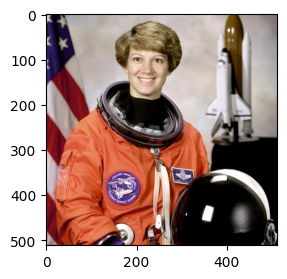

In [7]:
url='https://raw.githubusercontent.com/pytorch/vision/main/gallery/assets/astronaut.jpg'
img= download_image_to_numpy(url)
orig_img=torch.from_numpy(img).permute(2,0,1) # (H,W,C) to (C,H,W)
print(f'orig_img: {orig_img.shape=}, {orig_img.dtype}, range: ({orig_img.min().item()}, {orig_img.max().item()})')
_, ax=plt.subplots(figsize=(3,3))
ax.imshow(orig_img.permute(1,2,0))

torch.Size([3, 512, 512]),torch.Size([3, 518, 518]),torch.Size([3, 532, 532]),torch.Size([3, 572, 572]),torch.Size([3, 612, 612]),


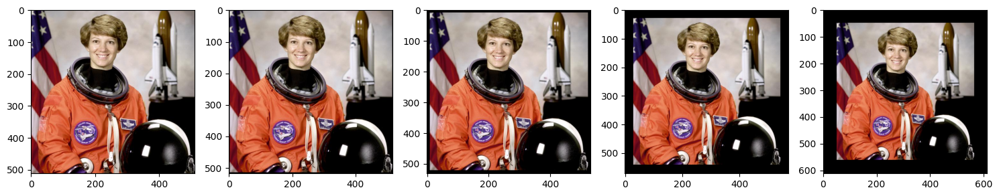

In [14]:
padded_imgs=[v2.Pad(padding=padding)(orig_img) for padding in (3,10,30,50)]
_, ax=plt.subplots(1,len(padded_imgs)+1, figsize=(15,3))
for i, im in enumerate([orig_img]+padded_imgs): 
    print(im.shape, end=',')
    ax[i].imshow(im.permute(1,2,0))
plt.tight_layout()
print()

torch.Size([3, 512, 512]),torch.Size([3, 30, 30]),torch.Size([3, 50, 50]),torch.Size([3, 100, 100]),torch.Size([3, 512, 512]),


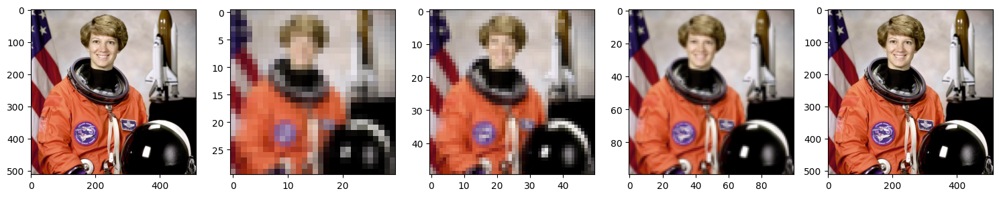

In [15]:
resized_imgs=[v2.Resize(size=size)(orig_img) for size in (30,50,100,orig_img.size()[-2:])]
_, ax=plt.subplots(1,len(resized_imgs)+1, figsize=(15,3))
for i, im in enumerate([orig_img]+resized_imgs): 
    print(im.shape, end=',')
    ax[i].imshow(im.permute(1,2,0))
plt.tight_layout()
print()

torch.Size([3, 512, 512]),torch.Size([3, 30, 30]),torch.Size([3, 50, 50]),torch.Size([3, 100, 100]),torch.Size([3, 512, 512]),


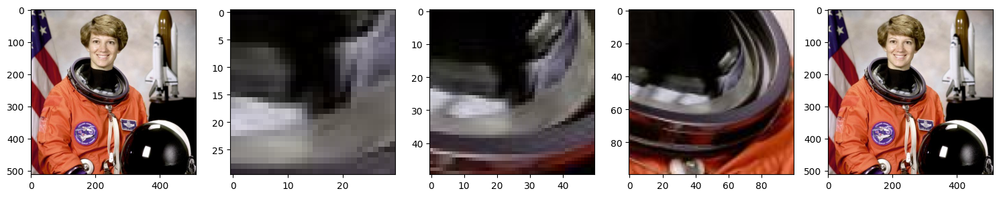

In [16]:
center_crops=[v2.CenterCrop(size=size)(orig_img) for size in (30,50,100,orig_img.shape[-2:])]
_, ax=plt.subplots(1,len(center_crops)+1, figsize=(15,3))
for i, im in enumerate([orig_img]+center_crops): 
    print(im.shape, end=',')
    ax[i].imshow(im.permute(1,2,0))
plt.tight_layout()
print()

torch.Size([3, 512, 512]),torch.Size([3, 100, 100]),torch.Size([3, 100, 100]),torch.Size([3, 100, 100]),torch.Size([3, 100, 100]),torch.Size([3, 100, 100]),


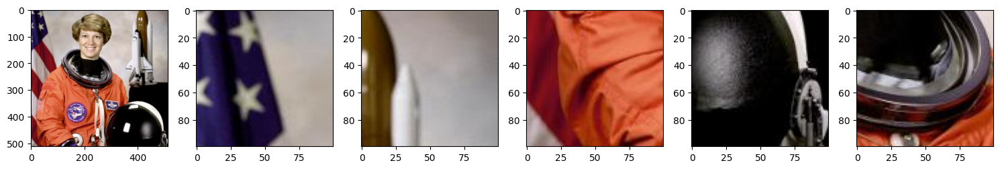

In [18]:
(top_left, top_right, bottom_left, bottom_right, center)=v2.FiveCrop(size=(100,100))(orig_img)
outputs=[top_left, top_right, bottom_left, bottom_right, center]
_, ax=plt.subplots(1,len(outputs)+1, figsize=(15,3))
for i, im in enumerate([orig_img]+outputs): 
    print(im.shape, end=',')
    ax[i].imshow(im.permute(1,2,0))
plt.tight_layout()
print()

torch.Size([3, 512, 512]),torch.Size([3, 512, 512]),torch.Size([3, 512, 512]),torch.Size([3, 512, 512]),torch.Size([3, 512, 512]),


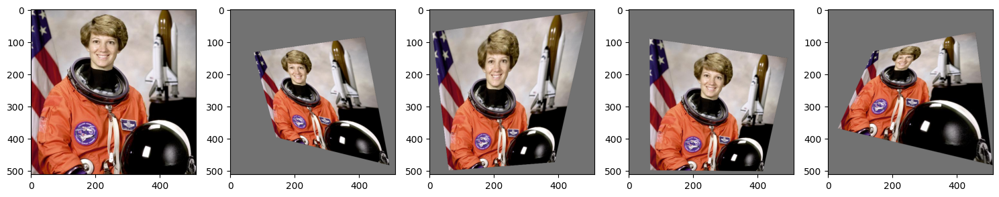

In [19]:
perspective_transformer=v2.RandomPerspective(distortion_scale=0.6, p=1., fill=(114, 114, 114))
perspective_imgs=[perspective_transformer(orig_img) for _ in range(4)]
_, ax=plt.subplots(1,len(perspective_imgs)+1, figsize=(15,3))
for i, im in enumerate([orig_img]+perspective_imgs): 
    print(im.shape, end=',')
    ax[i].imshow(im.permute(1,2,0))
plt.tight_layout()
print()

torch.Size([3, 512, 512]),torch.Size([3, 512, 512]),torch.Size([3, 512, 512]),torch.Size([3, 512, 512]),torch.Size([3, 512, 512]),


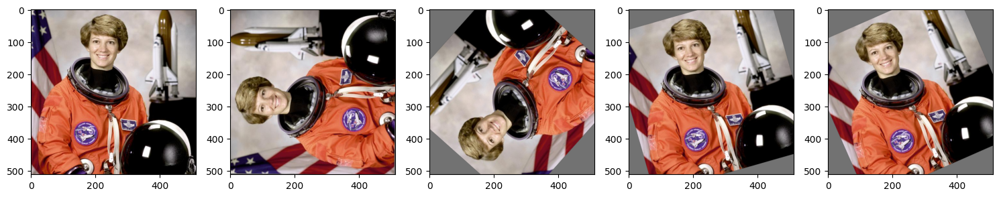

In [23]:
rotator=v2.RandomRotation(degrees=(0,180), interpolation=InterpolationMode.BILINEAR,fill=(114,114,114))
rotated_imgs=[rotator(orig_img) for _ in range(4)]
_, ax=plt.subplots(1,len(rotated_imgs)+1, figsize=(15,3))
for i, im in enumerate([orig_img]+rotated_imgs): 
    print(im.shape, end=',')
    ax[i].imshow(im.permute(1,2,0))
plt.tight_layout()
print()

torch.Size([3, 512, 512]),torch.Size([3, 512, 512]),torch.Size([3, 512, 512]),torch.Size([3, 512, 512]),torch.Size([3, 512, 512]),


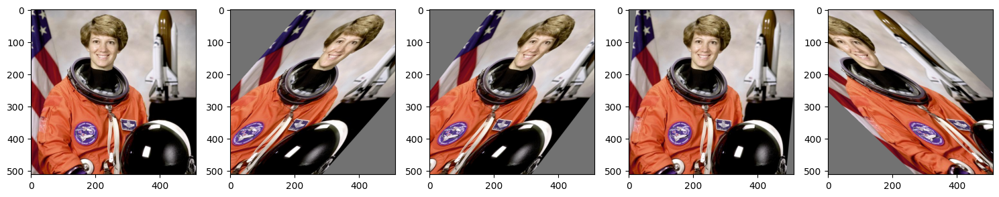

In [27]:
affine_transformer=v2.RandomAffine(degrees=0,shear=50, interpolation=InterpolationMode.BILINEAR, fill=114)
affine_imgs=[affine_transformer(orig_img) for _ in range(4)]
_, ax=plt.subplots(1,len(affine_imgs)+1, figsize=(15,3))
for i, im in enumerate([orig_img]+affine_imgs): 
    print(im.shape, end=',')
    ax[i].imshow(im.permute(1,2,0))
plt.tight_layout()
print()

torch.Size([3, 512, 512]),torch.Size([3, 512, 512]),torch.Size([3, 512, 512]),torch.Size([3, 512, 512]),torch.Size([3, 512, 512]),


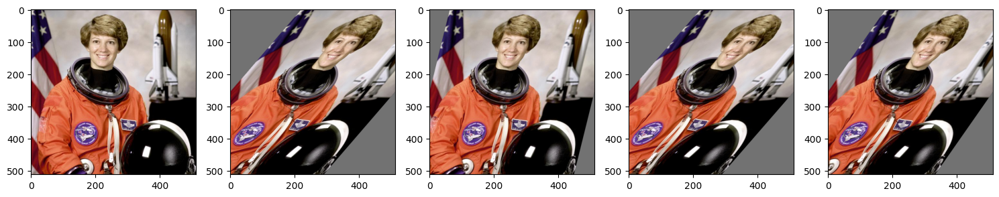

In [31]:
affine_transformer=v2.RandomAffine(degrees=0,shear=(0,50), interpolation=InterpolationMode.BILINEAR, fill=114)
affine_imgs=[affine_transformer(orig_img) for _ in range(4)]
_, ax=plt.subplots(1,len(affine_imgs)+1, figsize=(15,3))
for i, im in enumerate([orig_img]+affine_imgs): 
    print(im.shape, end=',')
    ax[i].imshow(im.permute(1,2,0))
plt.tight_layout()
print()

torch.Size([3, 512, 512]),torch.Size([3, 512, 512]),torch.Size([3, 512, 512]),torch.Size([3, 512, 512]),torch.Size([3, 512, 512]),


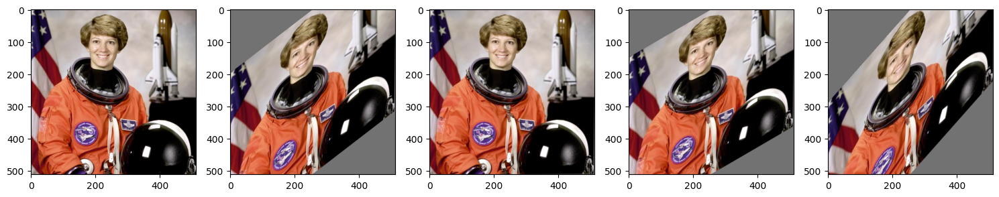

In [35]:
# Shear along Y-axis
affine_transformer=v2.RandomAffine(degrees=0,shear=(0,1,0,50), interpolation=InterpolationMode.BILINEAR, fill=114)
affine_imgs=[affine_transformer(orig_img) for _ in range(4)]
_, ax=plt.subplots(1,len(affine_imgs)+1, figsize=(15,3))
for i, im in enumerate([orig_img]+affine_imgs): 
    print(im.shape, end=',')
    ax[i].imshow(im.permute(1,2,0))
plt.tight_layout()
print()

torch.Size([3, 512, 512]),torch.Size([3, 512, 512]),torch.Size([3, 512, 512]),torch.Size([3, 512, 512]),torch.Size([3, 512, 512]),


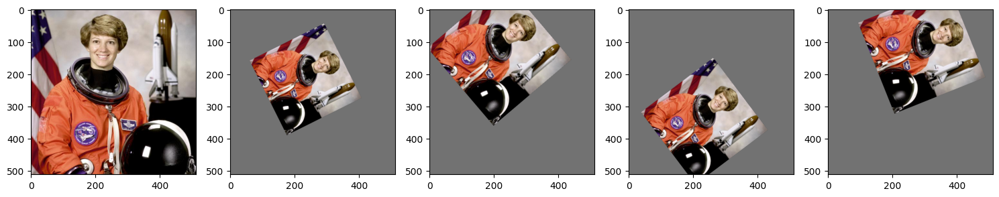

In [36]:
affine_transformer=v2.RandomAffine(degrees=(30,70), translate=(0.1,0.3), scale=(0.5,0.75), interpolation=InterpolationMode.BILINEAR, fill=114)
affine_imgs=[affine_transformer(orig_img) for _ in range(4)]
_, ax=plt.subplots(1,len(affine_imgs)+1, figsize=(15,3))
for i, im in enumerate([orig_img]+affine_imgs): 
    print(im.shape, end=',')
    ax[i].imshow(im.permute(1,2,0))
plt.tight_layout()
print()

torch.Size([3, 512, 512]),torch.Size([3, 512, 512]),torch.Size([3, 512, 512]),


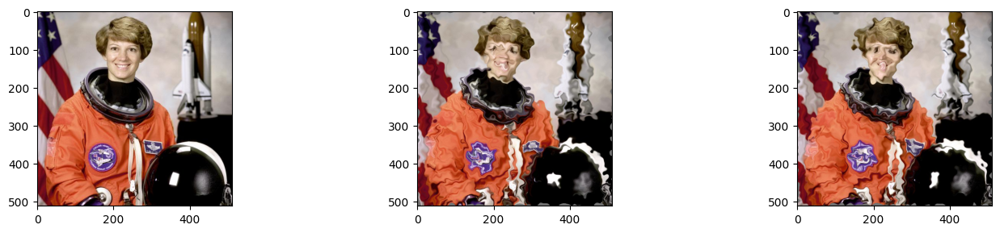

In [38]:
elastic_transformer=v2.ElasticTransform(alpha=250.,sigma=5.0, interpolation=InterpolationMode.BILINEAR, fill=114)
transformed_imgs=[elastic_transformer(orig_img) for _ in range(2)]
_, ax=plt.subplots(1,len(transformed_imgs)+1, figsize=(15,3))
for i, im in enumerate([orig_img]+transformed_imgs): 
    print(im.shape, end=',')
    ax[i].imshow(im.permute(1,2,0))
plt.tight_layout()
print()

torch.Size([3, 512, 512]),torch.Size([3, 128, 128]),torch.Size([3, 128, 128]),torch.Size([3, 128, 128]),torch.Size([3, 128, 128]),


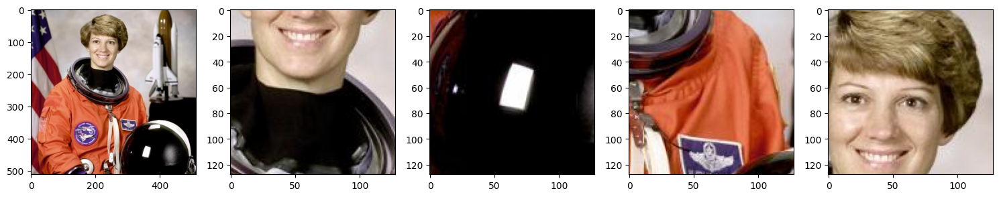

In [39]:
cropper=v2.RandomCrop(size=(128,128))
crops=[cropper(orig_img) for _ in range(4)]
_, ax=plt.subplots(1,len(crops)+1, figsize=(15,3))
for i, im in enumerate([orig_img]+crops): 
    print(im.shape, end=',')
    ax[i].imshow(im.permute(1,2,0))
plt.tight_layout()
print()

torch.Size([3, 512, 512]),torch.Size([3, 32, 32]),torch.Size([3, 32, 32]),torch.Size([3, 32, 32]),torch.Size([3, 32, 32]),


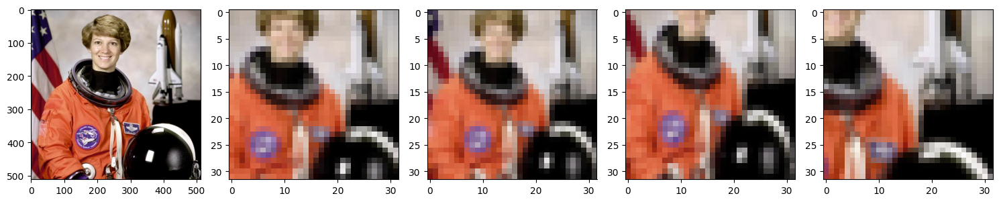

In [40]:
resize_cropper=v2.RandomResizedCrop(size=(32,32),scale=(0.08, 1.0), ratio=(0.75, 1.3333333333333333),interpolation=InterpolationMode.BILINEAR,
                                   antialias=True)
resized_crops=[resize_cropper(orig_img) for _ in range(4)]
_, ax=plt.subplots(1,len(resized_crops)+1, figsize=(15,3))
for i, im in enumerate([orig_img]+resized_crops): 
    print(im.shape, end=',')
    ax[i].imshow(im.permute(1,2,0))
plt.tight_layout()
print()

torch.Size([3, 512, 512]),torch.Size([1, 512, 512]),


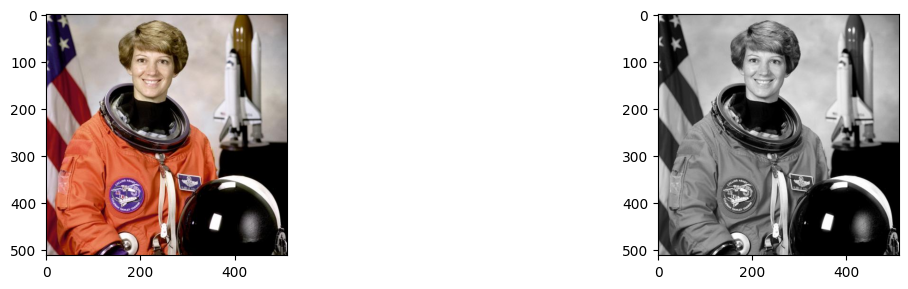

In [42]:
gray_img=v2.Grayscale()(orig_img)
_, ax=plt.subplots(1,2, figsize=(15,3))
for i, im in enumerate([orig_img, gray_img]): 
    print(im.shape, end=',')
    ax[i].imshow(im.permute(1,2,0), cmap=None if i==0 else 'gray')
plt.tight_layout()
print()

torch.Size([3, 512, 512]),torch.Size([3, 512, 512]),torch.Size([3, 512, 512]),torch.Size([3, 512, 512]),torch.Size([3, 512, 512]),


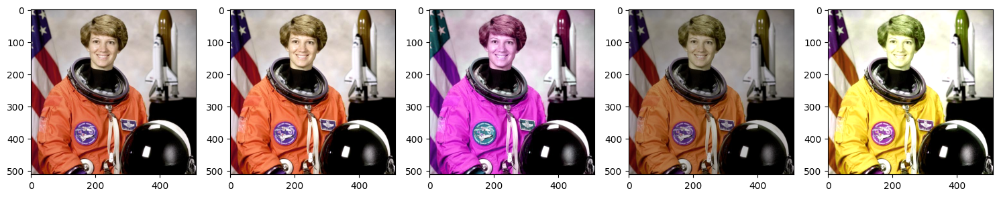

In [43]:
jitter=v2.ColorJitter(brightness=.5, hue=.3)
jittered_imgs=[jitter(orig_img) for _ in range(4)]
_, ax=plt.subplots(1,len(jittered_imgs)+1, figsize=(15,3))
for i, im in enumerate([orig_img]+jittered_imgs): 
    print(im.shape, end=',')
    ax[i].imshow(im.permute(1,2,0), cmap=None if i==0 else 'gray')
plt.tight_layout()
print()

torch.Size([3, 512, 512]),torch.Size([3, 512, 512]),torch.Size([3, 512, 512]),


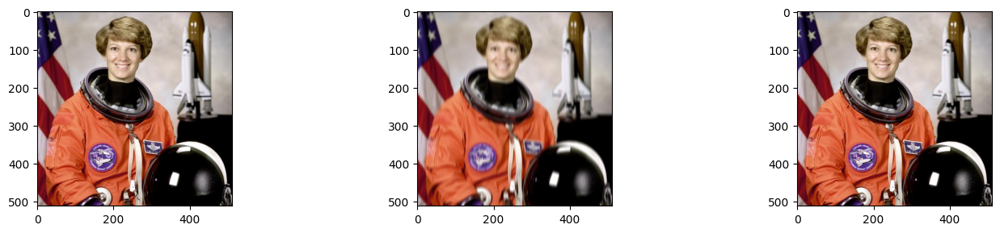

In [46]:
blurrer=v2.GaussianBlur(kernel_size=(1,11), sigma=5.)
blurred_imgs=[blurrer(orig_img)]
blurrer=v2.GaussianBlur(kernel_size=(1,1), sigma=5.)
blurred_imgs+=[blurrer(orig_img)]
_, ax=plt.subplots(1,len(blurred_imgs)+1, figsize=(15,3))
for i, im in enumerate([orig_img]+blurred_imgs): 
    print(im.shape, end=',')
    ax[i].imshow(im.permute(1,2,0), cmap=None if i==0 else 'gray')
plt.tight_layout()
print()

torch.Size([3, 512, 512]),torch.Size([3, 512, 512]),tensor(70134556)
torch.Size([3, 512, 512]),tensor(6335269)
torch.Size([3, 512, 512]),tensor(55045246)
torch.Size([3, 512, 512]),tensor(39542299)



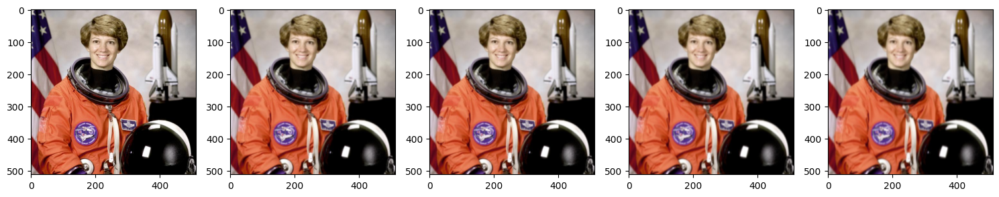

In [59]:
blurrer=v2.GaussianBlur(kernel_size=(5,9), sigma=(0.1,5.))
blurred_imgs=[blurrer(orig_img) for _ in range(4)]
_, ax=plt.subplots(1,len(blurred_imgs)+1, figsize=(15,3))
prev_im=None
for i, im in enumerate([orig_img]+blurred_imgs): 
    print(im.shape, end=',')
    ax[i].imshow(im.permute(1,2,0), cmap=None if i==0 else 'gray')
    if i>0:print((im-prev_im).sum())
    prev_im=im
plt.tight_layout()
print()

torch.Size([3, 512, 512]),torch.Size([3, 512, 512]),tensor(116628086)
torch.Size([3, 512, 512]),tensor(0)
torch.Size([3, 512, 512]),tensor(0)
torch.Size([3, 512, 512]),tensor(0)



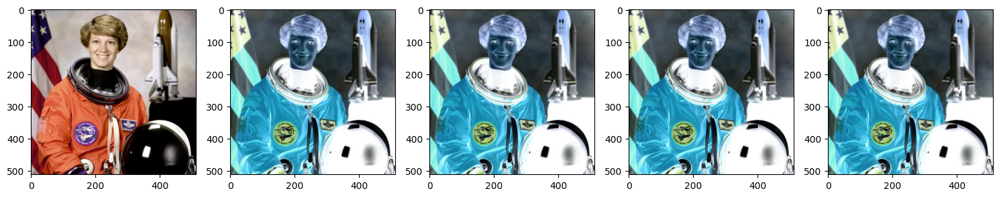

In [58]:
inverter=v2.RandomInvert(p=1.)
inverted_imgs=[inverter(orig_img) for _ in range(4)]
_, ax=plt.subplots(1,len(inverted_imgs)+1, figsize=(15,3))
prev_im=None
for i, im in enumerate([orig_img]+inverted_imgs): 
    print(im.shape, end=',')
    ax[i].imshow(im.permute(1,2,0), cmap=None if i==0 else 'gray')
    if i>0:print((im-prev_im).sum())
    prev_im=im
plt.tight_layout()
print()

torch.Size([3, 512, 512]),torch.Size([3, 512, 512]),tensor(155228603)
torch.Size([3, 512, 512]),tensor(0)
torch.Size([3, 512, 512]),tensor(0)
torch.Size([3, 512, 512]),tensor(0)



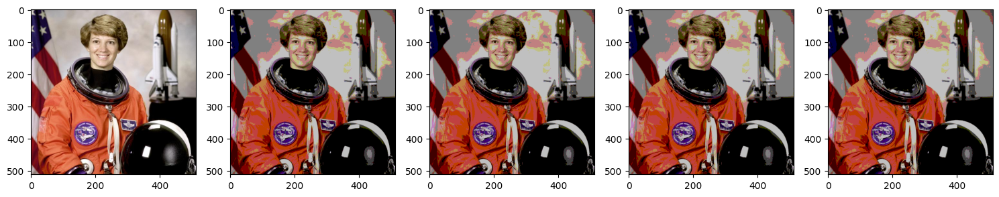

In [57]:
posterizer=v2.RandomPosterize(bits=2,p=1.)
posterized_imgs=[posterizer(orig_img) for _ in range(4)]
_, ax=plt.subplots(1,len(posterized_imgs)+1, figsize=(15,3))
prev_im=None
for i, im in enumerate([orig_img]+posterized_imgs): 
    print(im.shape, end=',')
    ax[i].imshow(im.permute(1,2,0), cmap=None if i==0 else 'gray')
    if i>0:print((im-prev_im).sum())
    prev_im=im
plt.tight_layout()
print()

torch.Size([3, 512, 512]),torch.Size([3, 512, 512]),tensor(15260138)
torch.Size([3, 512, 512]),tensor(0)
torch.Size([3, 512, 512]),tensor(0)
torch.Size([3, 512, 512]),tensor(0)



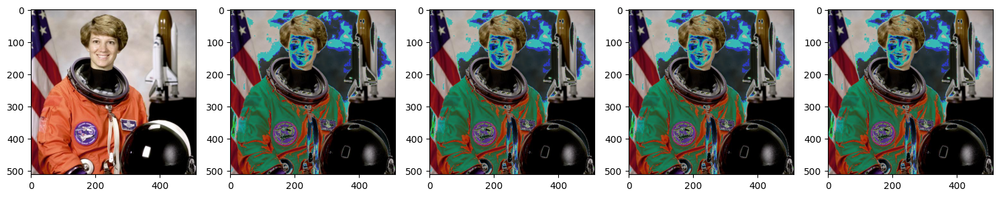

In [56]:
solarizer=v2.RandomSolarize(threshold=192, p=1)
solarized_imgs=[solarizer(orig_img) for _ in range(4)]
_, ax=plt.subplots(1,len(solarized_imgs)+1, figsize=(15,3))
prev_im=None
for i, im in enumerate([orig_img]+solarized_imgs): 
    print(im.shape, end=',')
    ax[i].imshow(im.permute(1,2,0), cmap=None if i==0 else 'gray')
    if i>0:print((im-prev_im).sum())
    prev_im=im
plt.tight_layout()
print()

torch.Size([3, 512, 512]),torch.Size([3, 512, 512]),tensor(15260138)
torch.Size([3, 512, 512]),tensor(0)
torch.Size([3, 512, 512]),tensor(0)
torch.Size([3, 512, 512]),tensor(0)



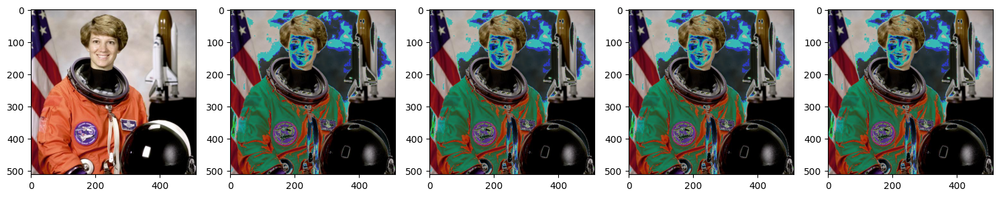

In [61]:
sharpness_adjust=v2.RandomAdjustSharpness(sharpness_factor=2, p=1)
sharpened_imgs=[sharpness_adjust(orig_img) for _ in range(4)]
_, ax=plt.subplots(1,len(sharpened_imgs)+1, figsize=(15,3))
prev_im=None
for i, im in enumerate([orig_img]+solarized_imgs): 
    print(im.shape, end=',')
    ax[i].imshow(im.permute(1,2,0))
    if i>0:print((im-prev_im).sum())
    prev_im=im
plt.tight_layout()
print()

torch.Size([3, 512, 512]),torch.Size([3, 512, 512]),tensor(0)
torch.Size([3, 512, 512]),tensor(0)
torch.Size([3, 512, 512]),tensor(0)
torch.Size([3, 512, 512]),tensor(0)



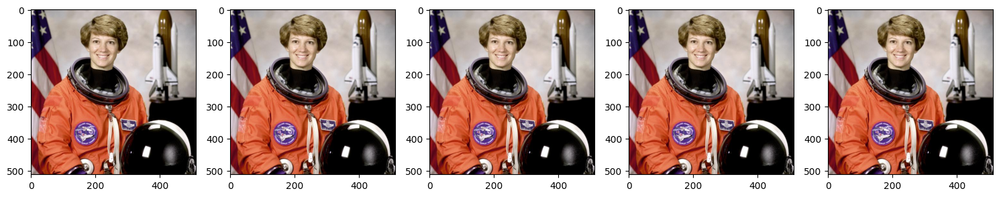

In [62]:
autocontrast=v2.RandomAutocontrast(p=1)
autocontrasted_imgs=[autocontrast(orig_img) for _ in range(4)]
_, ax=plt.subplots(1,len(autocontrasted_imgs)+1, figsize=(15,3))
prev_im=None
for i, im in enumerate([orig_img]+autocontrasted_imgs): 
    print(im.shape, end=',')
    ax[i].imshow(im.permute(1,2,0))
    if i>0:print((im-prev_im).sum())
    prev_im=im
plt.tight_layout()
print()

torch.Size([3, 512, 512]),torch.Size([3, 512, 512]),tensor(51816251)
torch.Size([3, 512, 512]),tensor(0)
torch.Size([3, 512, 512]),tensor(0)
torch.Size([3, 512, 512]),tensor(0)



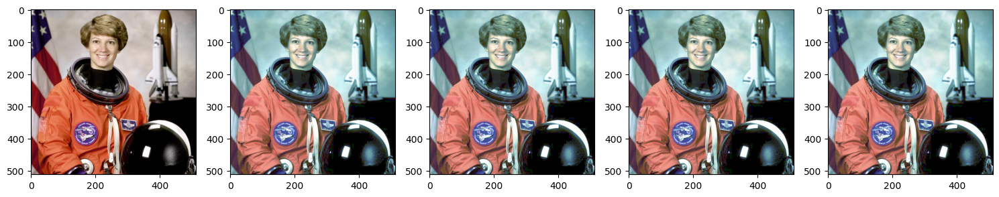

In [63]:
equalizer=v2.RandomEqualize(p=1)
equalized_imgs=[equalizer(orig_img) for _ in range(4)]
_, ax=plt.subplots(1,len(equalized_imgs)+1, figsize=(15,3))
prev_im=None
for i, im in enumerate([orig_img]+equalized_imgs): 
    print(im.shape, end=',')
    ax[i].imshow(im.permute(1,2,0))
    if i>0:print((im-prev_im).sum())
    prev_im=im
plt.tight_layout()
print()

torch.Size([3, 512, 512]),torch.Size([3, 512, 512]),tensor(79073151)
torch.Size([3, 512, 512]),tensor(101304120)
torch.Size([3, 512, 512]),tensor(84545095)
torch.Size([3, 512, 512]),tensor(85540411)



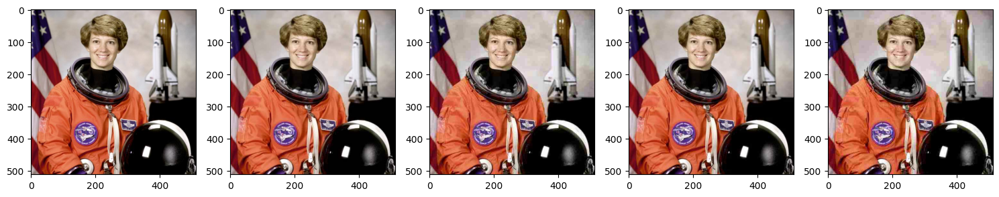

In [64]:
jpeg=v2.JPEG(quality=(5,50))
jpeg_imgs=[jpeg(orig_img) for _ in range(4)]
_, ax=plt.subplots(1,len(jpeg_imgs)+1, figsize=(15,3))
prev_im=None
for i, im in enumerate([orig_img]+jpeg_imgs): 
    print(im.shape, end=',')
    ax[i].imshow(im.permute(1,2,0))
    if i>0:print((im-prev_im).sum())
    prev_im=im
plt.tight_layout()
print()

torch.Size([3, 512, 512]),torch.Size([3, 512, 512]),tensor(52475678)
torch.Size([3, 512, 512]),tensor(71765359)
torch.Size([3, 512, 512]),tensor(64210350)
torch.Size([3, 512, 512]),tensor(124701637)

torch.Size([3, 512, 512]),torch.Size([3, 512, 512]),tensor(0)
torch.Size([3, 512, 512]),tensor(0)
torch.Size([3, 512, 512]),tensor(0)
torch.Size([3, 512, 512]),tensor(93119658)

torch.Size([3, 512, 512]),torch.Size([3, 512, 512]),tensor(89666595)
torch.Size([3, 512, 512]),tensor(97605128)
torch.Size([3, 512, 512]),tensor(94137541)
torch.Size([3, 512, 512]),tensor(92407020)



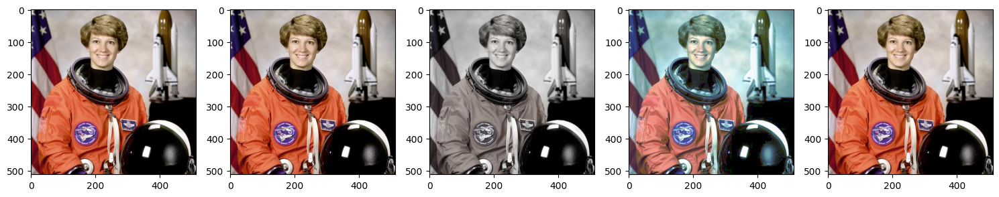

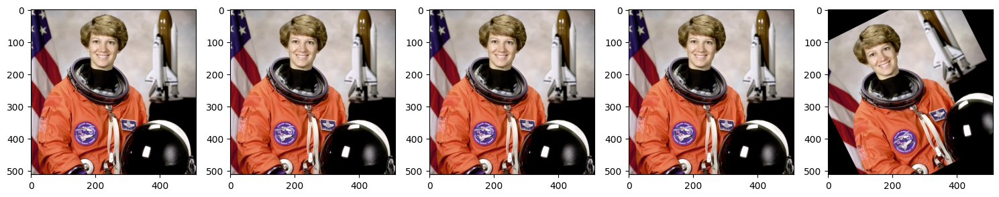

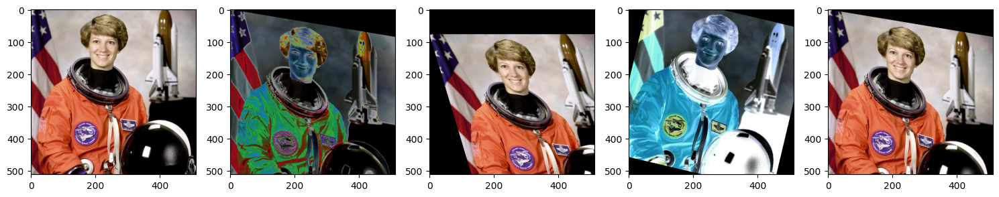

In [65]:
policies=[v2.AutoAugmentPolicy.CIFAR10, v2.AutoAugmentPolicy.IMAGENET, v2.AutoAugmentPolicy.SVHN]
for policy in policies:
    augmenter=v2.AutoAugment(policy)
    imgs=[augmenter(orig_img) for _ in range(4)]
    
    _, ax=plt.subplots(1,len(imgs)+1, figsize=(15,3))
    prev_im=None
    for i, im in enumerate([orig_img]+imgs): 
        print(im.shape, end=',')
        ax[i].imshow(im.permute(1,2,0))
        if i>0:print((im-prev_im).sum())
        prev_im=im
    plt.tight_layout()
    print()

torch.Size([3, 512, 512]),torch.Size([3, 512, 512]),tensor(23722057)
torch.Size([3, 512, 512]),tensor(0)
torch.Size([3, 512, 512]),tensor(95781185)
torch.Size([3, 512, 512]),tensor(110825314)



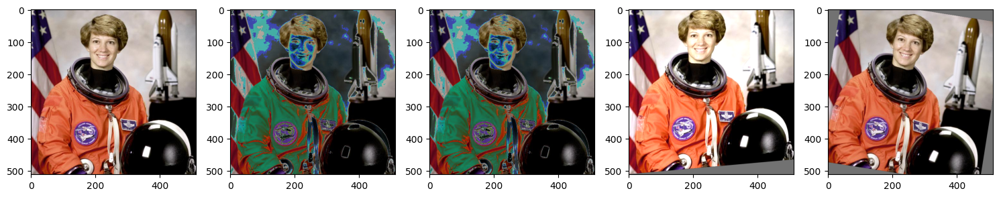

In [66]:
augmenter=v2.RandAugment(interpolation=InterpolationMode.BILINEAR, fill=114)
imgs=[augmenter(orig_img) for _ in range(4)]

_, ax=plt.subplots(1,len(imgs)+1, figsize=(15,3))
prev_im=None
for i, im in enumerate([orig_img]+imgs): 
    print(im.shape, end=',')
    ax[i].imshow(im.permute(1,2,0))
    if i>0:print((im-prev_im).sum())
    prev_im=im
plt.tight_layout()
print()

torch.Size([3, 512, 512]),torch.Size([3, 512, 512]),tensor(154297163)
torch.Size([3, 512, 512]),tensor(73968421)
torch.Size([3, 512, 512]),tensor(94075447)
torch.Size([3, 512, 512]),tensor(1413877)



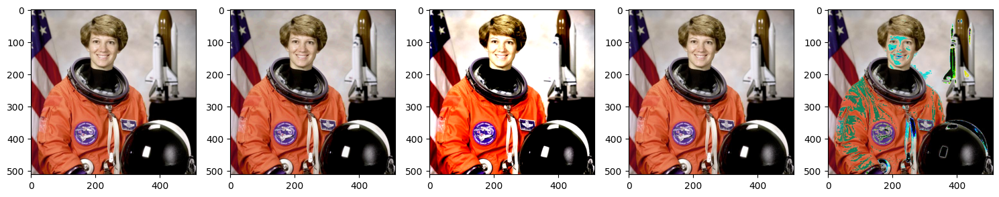

In [67]:
augmenter=v2.TrivialAugmentWide(interpolation=InterpolationMode.BILINEAR, fill=114)
imgs=[augmenter(orig_img) for _ in range(4)]

_, ax=plt.subplots(1,len(imgs)+1, figsize=(15,3))
prev_im=None
for i, im in enumerate([orig_img]+imgs): 
    print(im.shape, end=',')
    ax[i].imshow(im.permute(1,2,0))
    if i>0:print((im-prev_im).sum())
    prev_im=im
plt.tight_layout()
print()

torch.Size([3, 512, 512]),torch.Size([3, 512, 512]),tensor(121400145)
torch.Size([3, 512, 512]),tensor(90357046)
torch.Size([3, 512, 512]),tensor(97233748)
torch.Size([3, 512, 512]),tensor(55192967)



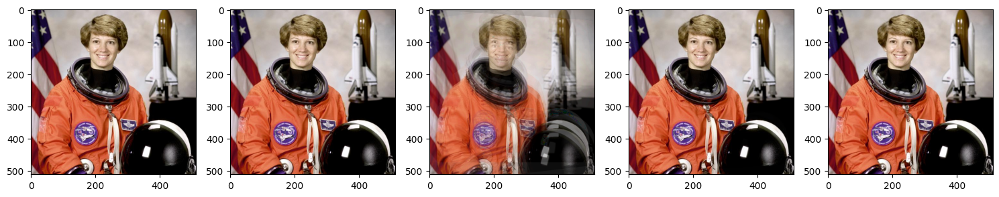

In [68]:
augmenter=v2.AugMix(interpolation=InterpolationMode.BILINEAR, fill=114)
imgs=[augmenter(orig_img) for _ in range(4)]

_, ax=plt.subplots(1,len(imgs)+1, figsize=(15,3))
prev_im=None
for i, im in enumerate([orig_img]+imgs): 
    print(im.shape, end=',')
    ax[i].imshow(im.permute(1,2,0))
    if i>0:print((im-prev_im).sum())
    prev_im=im
plt.tight_layout()
print()

torch.Size([3, 512, 512]),torch.Size([3, 512, 512]),tensor(99587328)
torch.Size([3, 512, 512]),tensor(0)
torch.Size([3, 512, 512]),tensor(99587328)
torch.Size([3, 512, 512]),tensor(99587328)



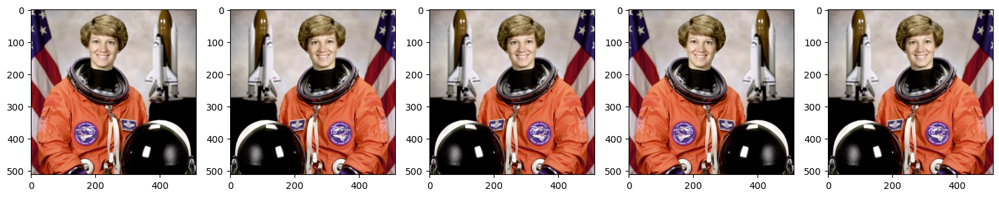

In [69]:
hflipper=v2.RandomHorizontalFlip(p=0.5)
transformed_imgs=[hflipper(orig_img) for _ in range(4)]

_, ax=plt.subplots(1,len(transformed_imgs)+1, figsize=(15,3))
prev_im=None
for i, im in enumerate([orig_img]+transformed_imgs): 
    print(im.shape, end=',')
    ax[i].imshow(im.permute(1,2,0))
    if i>0:print((im-prev_im).sum())
    prev_im=im
plt.tight_layout()
print()

torch.Size([3, 512, 512]),torch.Size([3, 512, 512]),tensor(0)
torch.Size([3, 512, 512]),tensor(0)
torch.Size([3, 512, 512]),tensor(99971072)
torch.Size([3, 512, 512]),tensor(0)



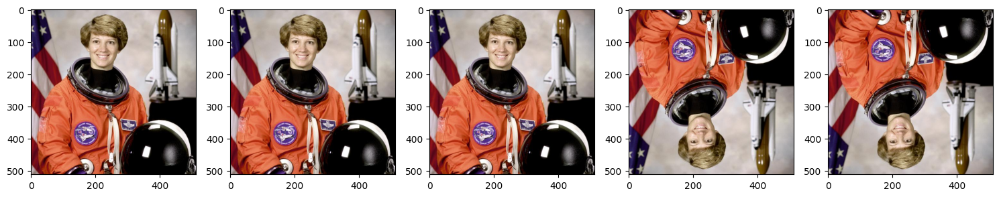

In [70]:
vflipper=v2.RandomVerticalFlip(p=0.5)
transformed_imgs=[vflipper(orig_img) for _ in range(4)]

_, ax=plt.subplots(1,len(transformed_imgs)+1, figsize=(15,3))
prev_im=None
for i, im in enumerate([orig_img]+transformed_imgs): 
    print(im.shape, end=',')
    ax[i].imshow(im.permute(1,2,0))
    if i>0:print((im-prev_im).sum())
    prev_im=im
plt.tight_layout()
print()

torch.Size([3, 512, 512]),torch.Size([3, 512, 512]),torch.Size([3, 512, 512]),torch.Size([3, 512, 512]),torch.Size([3, 64, 64]),


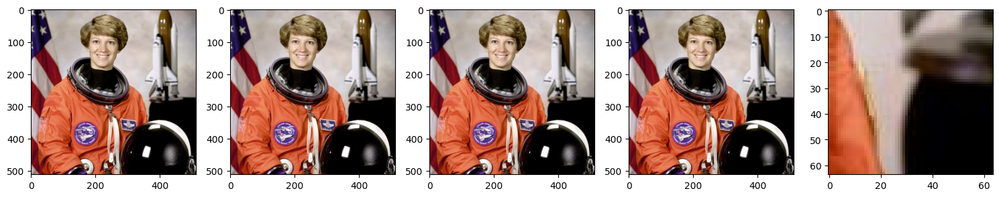

In [72]:
applier=v2.RandomApply(transforms=[v2.RandomCrop(size=(64,64))], p=0.5)
transformed_imgs=[applier(orig_img) for _ in range(4)]

_, ax=plt.subplots(1,len(transformed_imgs)+1, figsize=(15,3))
for i, im in enumerate([orig_img]+transformed_imgs): 
    print(im.shape, end=',')
    ax[i].imshow(im.permute(1,2,0))
plt.tight_layout()
print()